# Brazilian E-Commerce Analysis: Retrospective Insights
## Delivery Performance & Customer Retention Analysis

This notebook provides a comprehensive analysis of the Olist Brazilian E-Commerce dataset focusing on:
1. **Delivery Performance Analysis** - Late vs on-time deliveries by product category
2. **Customer Retention Analysis** - RFM segmentation and lifetime value calculation

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from datetime import datetime, timedelta
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print("Libraries imported successfully!")

Libraries imported successfully!


## Data Loading and Initial Exploration

In [14]:
# Load all datasets
orders = pd.read_csv('Data/olist_orders_dataset.csv')
order_items = pd.read_csv('Data/olist_order_items_dataset.csv')
customers = pd.read_csv('Data/olist_customers_dataset.csv')
products = pd.read_csv('Data/olist_products_dataset.csv')
payments = pd.read_csv('Data/olist_order_payments_dataset.csv')
reviews = pd.read_csv('Data/olist_order_reviews_dataset.csv')
sellers = pd.read_csv('Data/olist_sellers_dataset.csv')
geolocation = pd.read_csv('Data/olist_geolocation_dataset.csv')
category_translation = pd.read_csv('Data/product_category_name_translation.csv')

print(f"Orders: {orders.shape}")
print(f"Order Items: {order_items.shape}")
print(f"Customers: {customers.shape}")
print(f"Products: {products.shape}")
print(f"Payments: {payments.shape}")
print(f"Reviews: {reviews.shape}")
print(f"Sellers: {sellers.shape}")
print(f"Geolocation: {geolocation.shape}")
print(f"Category Translation: {category_translation.shape}")

Orders: (99441, 8)
Order Items: (112650, 7)
Customers: (99441, 5)
Products: (32951, 9)
Payments: (103886, 5)
Reviews: (99224, 7)
Sellers: (3095, 4)
Geolocation: (1000163, 5)
Category Translation: (71, 2)


In [ ]:
# Data preprocessing and datetime conversion
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])
orders['order_delivered_customer_date'] = pd.to_datetime(orders['order_delivered_customer_date'])
orders['order_estimated_delivery_date'] = pd.to_datetime(orders['order_estimated_delivery_date'])
orders['order_approved_at'] = pd.to_datetime(orders['order_approved_at'])
orders['order_delivered_carrier_date'] = pd.to_datetime(orders['order_delivered_carrier_date'])

# Calculate delivery performance metrics
orders['delivery_days'] = (orders['order_delivered_customer_date'] - orders['order_purchase_timestamp']).dt.days
orders['estimated_delivery_days'] = (orders['order_estimated_delivery_date'] - orders['order_purchase_timestamp']).dt.days
orders['delivery_delay_days'] = (orders['order_delivered_customer_date'] - orders['order_estimated_delivery_date']).dt.days
orders['is_late'] = orders['delivery_delay_days'] > 0

# Filter only delivered orders for delivery analysis
delivered_orders = orders[orders['order_status'] == 'delivered'].copy()

print(f"Total orders: {len(orders)}")
print(f"Delivered orders: {len(delivered_orders)}")
print(f"Late deliveries: {delivered_orders['is_late'].sum()} ({delivered_orders['is_late'].mean()*100:.1f}%)")

# Print columns to verify they exist
print(f"\nDelivered orders columns: {delivered_orders.columns.tolist()}")

## Part 1: Delivery Performance Analysis
### Advanced Visualization: Waterfall Chart for Delivery Performance by Category

In [16]:
# Merge data for delivery analysis
delivery_analysis = delivered_orders.merge(order_items, on='order_id')
delivery_analysis = delivery_analysis.merge(products, on='product_id')
delivery_analysis = delivery_analysis.merge(category_translation, on='product_category_name', how='left')

# Calculate delivery performance by category
category_performance = delivery_analysis.groupby('product_category_name_english').agg({
    'is_late': ['count', 'sum', 'mean'],
    'delivery_delay_days': ['mean', 'median'],
    'delivery_days': ['mean', 'median'],
    'price': 'mean'
}).round(2)

category_performance.columns = ['total_orders', 'late_orders', 'late_rate', 'avg_delay_days', 'median_delay_days', 'avg_delivery_days', 'median_delivery_days', 'avg_price']
category_performance = category_performance[category_performance['total_orders'] >= 100].sort_values('late_rate', ascending=False)

print("Top 10 Categories with Highest Late Delivery Rates:")
print(category_performance.head(10)[['total_orders', 'late_rate', 'avg_delay_days']])

Top 10 Categories with Highest Late Delivery Rates:
                               total_orders  late_rate  avg_delay_days
product_category_name_english                                         
audio                                   362       0.12          -10.15
christmas_supplies                      150       0.10          -12.05
fashion_underwear_beach                 127       0.09          -10.93
home_confort                            429       0.09           -9.81
electronics                            2729       0.08          -11.14
health_beauty                          9465       0.08          -11.97
books_technical                         263       0.08          -11.31
office_furniture                       1668       0.08          -11.85
baby                                   2982       0.08          -11.65
musical_instruments                     651       0.07          -11.48


In [17]:
# Create sophisticated waterfall chart for delivery performance
top_categories = category_performance.head(15)

fig = go.Figure()

# Calculate cumulative effect
baseline_late_rate = delivered_orders['is_late'].mean()
cumulative_effect = 0

x_labels = []
y_values = []
colors = []
text_values = []

# Add baseline
x_labels.append('Overall Rate')
y_values.append(baseline_late_rate * 100)
colors.append('blue')
text_values.append(f'{baseline_late_rate*100:.1f}%')

# Add category impacts
for category, row in top_categories.iterrows():
    category_impact = (row['late_rate'] - baseline_late_rate) * 100
    x_labels.append(category[:20] + '...' if len(category) > 20 else category)
    y_values.append(category_impact)
    colors.append('red' if category_impact > 0 else 'green')
    text_values.append(f'{row["late_rate"]*100:.1f}%')

fig.add_trace(go.Waterfall(
    name="Delivery Performance",
    orientation="v",
    measure=["absolute"] + ["relative"] * len(top_categories),
    x=x_labels,
    y=y_values,
    text=text_values,
    textposition="outside",
    connector={"line":{"color":"rgb(63, 63, 63)"}},
    increasing={"marker":{"color":"red"}},
    decreasing={"marker":{"color":"green"}},
    totals={"marker":{"color":"blue"}}
))

fig.update_layout(
    title="Delivery Performance Waterfall: Late Delivery Rates by Product Category<br><sub>Categories with >100 orders, showing deviation from overall rate</sub>",
    xaxis_title="Product Categories",
    yaxis_title="Late Delivery Rate (%)",
    height=600,
    showlegend=False,
    xaxis_tickangle=-45
)

fig.show()

print(f"\nOverall late delivery rate: {baseline_late_rate*100:.1f}%")
print(f"Worst performing category: {top_categories.index[0]} ({top_categories.iloc[0]['late_rate']*100:.1f}%)")
print(f"Best performing category: {top_categories.index[-1]} ({top_categories.iloc[-1]['late_rate']*100:.1f}%)")


Overall late delivery rate: 6.8%
Worst performing category: audio (12.0%)
Best performing category: furniture_decor (7.0%)


In [18]:
# Create Sankey diagram for delivery flow analysis
# Analyze delivery performance by state and category
state_category_analysis = delivery_analysis.merge(customers, on='customer_id')
state_performance = state_category_analysis.groupby(['customer_state', 'product_category_name_english']).agg({
    'is_late': ['count', 'sum'],
    'delivery_days': 'mean'
}).round(2)

state_performance.columns = ['total_orders', 'late_orders', 'avg_delivery_days']
state_performance['late_rate'] = state_performance['late_orders'] / state_performance['total_orders']
state_performance = state_performance[state_performance['total_orders'] >= 50].reset_index()

# Get top states and categories for Sankey
top_states = state_performance.groupby('customer_state')['total_orders'].sum().nlargest(8).index.tolist()
top_cats = state_performance.groupby('product_category_name_english')['total_orders'].sum().nlargest(10).index.tolist()

sankey_data = state_performance[
    (state_performance['customer_state'].isin(top_states)) & 
    (state_performance['product_category_name_english'].isin(top_cats))
]

# Create Sankey diagram
states = sankey_data['customer_state'].unique().tolist()
categories = sankey_data['product_category_name_english'].unique().tolist()
performance_levels = ['On Time', 'Late']

all_nodes = states + categories + performance_levels
node_colors = ['lightblue'] * len(states) + ['lightgreen'] * len(categories) + ['green', 'red']

source = []
target = []
value = []
link_colors = []

for _, row in sankey_data.iterrows():
    state_idx = all_nodes.index(row['customer_state'])
    cat_idx = all_nodes.index(row['product_category_name_english'])
    
    # State to Category
    source.append(state_idx)
    target.append(cat_idx)
    value.append(row['total_orders'])
    link_colors.append('rgba(0,0,255,0.3)')
    
    # Category to Performance
    on_time_orders = row['total_orders'] - row['late_orders']
    
    if on_time_orders > 0:
        source.append(cat_idx)
        target.append(all_nodes.index('On Time'))
        value.append(on_time_orders)
        link_colors.append('rgba(0,255,0,0.3)')
    
    if row['late_orders'] > 0:
        source.append(cat_idx)
        target.append(all_nodes.index('Late'))
        value.append(row['late_orders'])
        link_colors.append('rgba(255,0,0,0.3)')

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=all_nodes,
        color=node_colors
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=link_colors
    )
)])

fig.update_layout(
    title_text="Delivery Performance Flow: States → Categories → Performance<br><sub>Top 8 states and top 10 categories by order volume</sub>",
    font_size=10,
    height=700
)

fig.show()

## Part 2: Customer Retention Analysis - RFM Segmentation
### Advanced Visualization: RFM 3D Scatter Plot and Customer Lifetime Value

In [19]:
# Calculate RFM metrics
# First, create customer transaction summary
customer_orders = orders.merge(order_items, on='order_id')
customer_orders = customer_orders.merge(payments.groupby('order_id')['payment_value'].sum().reset_index(), on='order_id')
customer_orders = customer_orders.merge(customers, on='customer_id')

# Set analysis date as the last date in dataset
analysis_date = customer_orders['order_purchase_timestamp'].max()
print(f"Analysis date: {analysis_date}")

# Calculate RFM metrics
rfm_data = customer_orders.groupby('customer_unique_id').agg({
    'order_purchase_timestamp': ['max', 'count'],
    'payment_value': ['sum', 'mean']
}).round(2)

rfm_data.columns = ['last_purchase_date', 'frequency', 'total_spent', 'avg_order_value']
rfm_data['recency'] = (analysis_date - rfm_data['last_purchase_date']).dt.days
rfm_data['monetary'] = rfm_data['total_spent']

print(f"RFM Data Shape: {rfm_data.shape}")
print(f"\nRFM Summary:")
print(rfm_data[['recency', 'frequency', 'monetary']].describe())

Analysis date: 2018-09-03 09:06:57
RFM Data Shape: (95419, 6)

RFM Summary:
            recency     frequency       monetary
count  95419.000000  95419.000000   95419.000000
mean     242.595406      1.180551     212.831142
std      153.153422      0.621425     641.763082
min        0.000000      1.000000       9.590000
25%      118.000000      1.000000      63.910000
50%      223.000000      1.000000     113.150000
75%      352.000000      1.000000     202.545000
max      728.000000     24.000000  109312.640000


In [20]:
# Create RFM scores using quintiles
rfm_data['R_score'] = pd.qcut(rfm_data['recency'], 5, labels=[5,4,3,2,1])  # Lower recency = higher score
rfm_data['F_score'] = pd.qcut(rfm_data['frequency'].rank(method='first'), 5, labels=[1,2,3,4,5])
rfm_data['M_score'] = pd.qcut(rfm_data['monetary'], 5, labels=[1,2,3,4,5])

# Convert to numeric for calculations
rfm_data['R_score'] = rfm_data['R_score'].astype(int)
rfm_data['F_score'] = rfm_data['F_score'].astype(int)
rfm_data['M_score'] = rfm_data['M_score'].astype(int)

# Create RFM segments
def segment_customers(row):
    if row['R_score'] >= 4 and row['F_score'] >= 4 and row['M_score'] >= 4:
        return 'Champions'
    elif row['R_score'] >= 3 and row['F_score'] >= 3 and row['M_score'] >= 3:
        return 'Loyal Customers'
    elif row['R_score'] >= 4 and row['F_score'] <= 2:
        return 'New Customers'
    elif row['R_score'] >= 3 and row['F_score'] >= 2 and row['M_score'] >= 2:
        return 'Potential Loyalists'
    elif row['R_score'] >= 3 and row['F_score'] <= 2:
        return 'Promising'
    elif row['R_score'] <= 2 and row['F_score'] >= 3:
        return 'At Risk'
    elif row['R_score'] <= 2 and row['F_score'] <= 2 and row['M_score'] >= 3:
        return "Can't Lose Them"
    elif row['R_score'] <= 2 and row['F_score'] <= 2:
        return 'Lost Customers'
    else:
        return 'Others'

rfm_data['segment'] = rfm_data.apply(segment_customers, axis=1)

# Display segment distribution
segment_summary = rfm_data.groupby('segment').agg({
    'recency': 'mean',
    'frequency': 'mean',
    'monetary': 'mean',
    'avg_order_value': 'mean'
}).round(2)

segment_counts = rfm_data['segment'].value_counts()
segment_summary['count'] = segment_counts
segment_summary['percentage'] = (segment_counts / len(rfm_data) * 100).round(1)

print("Customer Segment Analysis:")
print(segment_summary.sort_values('monetary', ascending=False))

Customer Segment Analysis:
                     recency  frequency  monetary  avg_order_value  count  \
segment                                                                     
Champions              95.42       1.85    532.60           276.78   7894   
Loyal Customers       161.44       1.26    264.33           200.36  14077   
At Risk               399.35       1.29    256.58           169.06  22836   
Can't Lose Them       400.57       1.00    235.41           235.41   8186   
New Customers          94.56       1.00    156.12           156.12  15282   
Promising             223.60       1.00    128.69           128.69   4703   
Potential Loyalists   166.62       1.02    105.53           104.82   9044   
Lost Customers        401.20       1.00     56.41            56.41   7092   
Others                138.77       1.00     39.79            39.71   6305   

                     percentage  
segment                          
Champions                   8.3  
Loyal Customers        

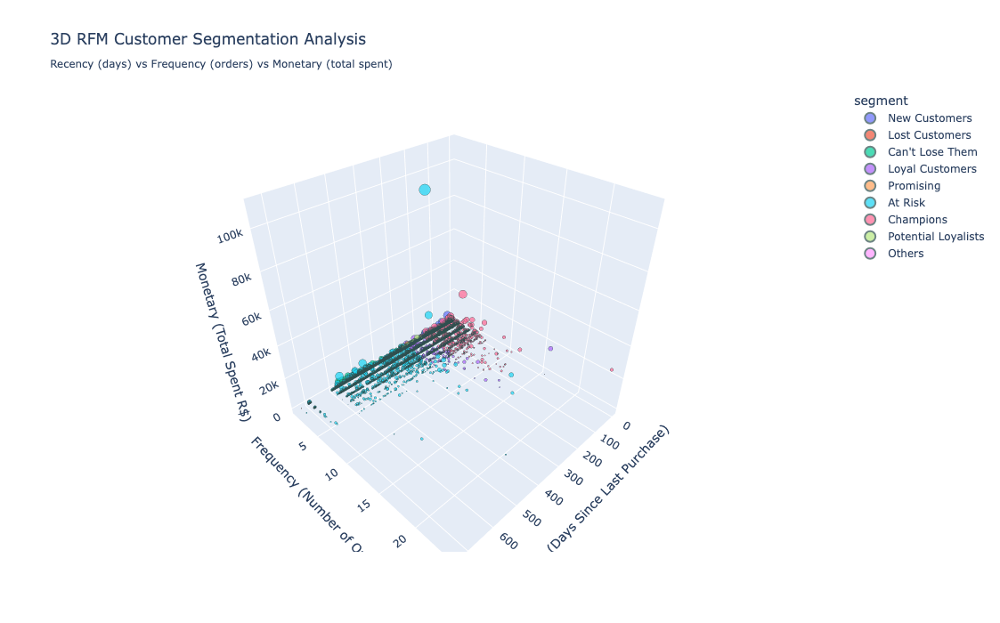

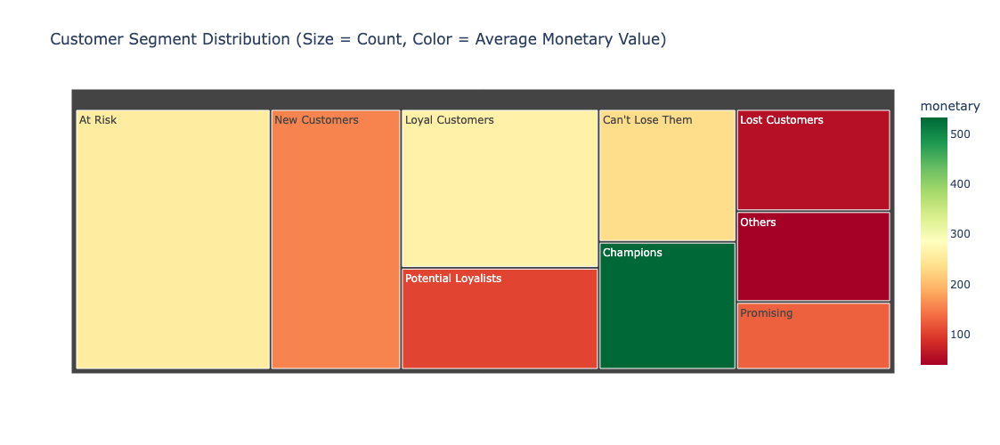

In [21]:
# Create advanced 3D RFM visualization
fig = px.scatter_3d(
    rfm_data.reset_index(), 
    x='recency', 
    y='frequency', 
    z='monetary',
    color='segment',
    size='avg_order_value',
    hover_data=['customer_unique_id'],
    title="3D RFM Customer Segmentation Analysis<br><sub>Recency (days) vs Frequency (orders) vs Monetary (total spent)</sub>",
    labels={
        'recency': 'Recency (Days Since Last Purchase)',
        'frequency': 'Frequency (Number of Orders)',
        'monetary': 'Monetary (Total Spent R$)'
    },
    height=700
)

fig.update_traces(marker=dict(line=dict(width=0.5, color='DarkSlateGrey')))
fig.show()

# Create segment treemap
segment_treemap_data = segment_summary.reset_index()
segment_treemap_data['label'] = segment_treemap_data['segment'] + '<br>' + segment_treemap_data['percentage'].astype(str) + '%'

fig2 = px.treemap(
    segment_treemap_data,
    path=['segment'],
    values='count',
    color='monetary',
    color_continuous_scale='RdYlGn',
    title="Customer Segment Distribution (Size = Count, Color = Average Monetary Value)",
    height=500
)

fig2.show()

In [22]:
# Calculate Customer Lifetime Value (CLV)
# CLV = (Average Order Value) × (Purchase Frequency) × (Customer Lifespan)

# Calculate customer lifespan (days between first and last purchase)
customer_lifespan = customer_orders.groupby('customer_unique_id')['order_purchase_timestamp'].agg(['min', 'max'])
customer_lifespan['lifespan_days'] = (customer_lifespan['max'] - customer_lifespan['min']).dt.days
customer_lifespan['lifespan_days'] = customer_lifespan['lifespan_days'].fillna(0)  # Single purchase customers

# Merge with RFM data
rfm_clv = rfm_data.merge(customer_lifespan[['lifespan_days']], left_index=True, right_index=True)

# Calculate purchase frequency per day (to annualize)
rfm_clv['purchase_frequency_per_day'] = rfm_clv['frequency'] / (rfm_clv['lifespan_days'] + 1)  # +1 to avoid division by zero

# Estimate annual CLV
rfm_clv['estimated_annual_clv'] = rfm_clv['avg_order_value'] * rfm_clv['purchase_frequency_per_day'] * 365

# For customers with only one purchase, use a different approach
single_purchase_mask = rfm_clv['frequency'] == 1
rfm_clv.loc[single_purchase_mask, 'estimated_annual_clv'] = rfm_clv.loc[single_purchase_mask, 'avg_order_value'] * 0.5  # Conservative estimate

# Calculate CLV by segment
clv_by_segment = rfm_clv.groupby('segment').agg({
    'estimated_annual_clv': ['mean', 'median', 'sum'],
    'frequency': 'mean',
    'avg_order_value': 'mean',
    'lifespan_days': 'mean'
}).round(2)

clv_by_segment.columns = ['avg_clv', 'median_clv', 'total_clv', 'avg_frequency', 'avg_order_value', 'avg_lifespan_days']
clv_by_segment['customer_count'] = rfm_clv['segment'].value_counts()

print("Customer Lifetime Value Analysis by Segment:")
print(clv_by_segment.sort_values('avg_clv', ascending=False))

Customer Lifetime Value Analysis by Segment:
                       avg_clv  median_clv     total_clv  avg_frequency  \
segment                                                                   
Champions            120202.00     1037.67  9.488746e+08           1.85   
At Risk               45407.62       63.27  1.036928e+09           1.29   
Loyal Customers       32430.55       81.62  4.565249e+08           1.26   
Potential Loyalists     357.81       38.34  3.236020e+06           1.02   
Can't Lose Them         117.70       79.71  9.635290e+05           1.00   
New Customers            78.06       51.07  1.192921e+06           1.00   
Promising                64.35       38.88  3.026228e+05           1.00   
Others                   48.17       20.11  3.036832e+05           1.00   
Lost Customers           28.20       28.39  2.000159e+05           1.00   

                     avg_order_value  avg_lifespan_days  customer_count  
segment                                                

In [23]:
# Create advanced CLV visualization - Mekko Chart
clv_viz_data = clv_by_segment.reset_index()
clv_viz_data['clv_per_customer'] = clv_viz_data['total_clv'] / clv_viz_data['customer_count']

# Create subplot with multiple visualizations
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=(
        'CLV Distribution by Segment',
        'Customer Count vs Average CLV',
        'Total CLV Contribution by Segment',
        'CLV vs Purchase Behavior'
    ),
    specs=[[{"type": "bar"}, {"type": "scatter"}],
           [{"type": "bar"}, {"type": "scatter"}]]
)

# Plot 1: CLV Distribution
fig.add_trace(
    go.Bar(
        x=clv_viz_data['segment'],
        y=clv_viz_data['avg_clv'],
        name='Avg CLV',
        marker_color='lightcoral'
    ),
    row=1, col=1
)

# Plot 2: Customer Count vs CLV
fig.add_trace(
    go.Scatter(
        x=clv_viz_data['customer_count'],
        y=clv_viz_data['avg_clv'],
        mode='markers+text',
        text=clv_viz_data['segment'],
        textposition='top center',
        marker=dict(size=clv_viz_data['avg_order_value']/5, color='lightblue'),
        name='Segments'
    ),
    row=1, col=2
)

# Plot 3: Total CLV Contribution
fig.add_trace(
    go.Bar(
        x=clv_viz_data['segment'],
        y=clv_viz_data['total_clv'],
        name='Total CLV',
        marker_color='lightgreen'
    ),
    row=2, col=1
)

# Plot 4: CLV vs Frequency
fig.add_trace(
    go.Scatter(
        x=clv_viz_data['avg_frequency'],
        y=clv_viz_data['avg_clv'],
        mode='markers+text',
        text=clv_viz_data['segment'],
        textposition='top center',
        marker=dict(size=clv_viz_data['customer_count']/100, color='orange'),
        name='CLV vs Frequency'
    ),
    row=2, col=2
)

fig.update_layout(
    height=800,
    title_text="Customer Lifetime Value Analysis Dashboard",
    showlegend=False
)

fig.update_xaxes(title_text="Customer Segments", row=1, col=1)
fig.update_xaxes(title_text="Customer Count", row=1, col=2)
fig.update_xaxes(title_text="Customer Segments", row=2, col=1)
fig.update_xaxes(title_text="Average Frequency", row=2, col=2)

fig.update_yaxes(title_text="Average CLV (R$)", row=1, col=1)
fig.update_yaxes(title_text="Average CLV (R$)", row=1, col=2)
fig.update_yaxes(title_text="Total CLV (R$)", row=2, col=1)
fig.update_yaxes(title_text="Average CLV (R$)", row=2, col=2)

fig.show()

# Summary statistics
total_clv = clv_viz_data['total_clv'].sum()
top_segment = clv_viz_data.loc[clv_viz_data['avg_clv'].idxmax(), 'segment']
top_contributor = clv_viz_data.loc[clv_viz_data['total_clv'].idxmax(), 'segment']

print(f"\nCLV Summary:")
print(f"Total estimated CLV: R$ {total_clv:,.2f}")
print(f"Highest value per customer: {top_segment}")
print(f"Largest total contribution: {top_contributor}")


CLV Summary:
Total estimated CLV: R$ 2,448,526,650.72
Highest value per customer: Champions
Largest total contribution: At Risk


## Geographic and Bias Analysis

In [ ]:
# Analyze geographic distribution and potential biases
# Note: customer_orders should already have customer info, but let's ensure proper merge
print("Checking customer_orders columns:", customer_orders.columns.tolist())
print("Checking if customer_state exists:", 'customer_state' in customer_orders.columns)

# If customer_state is missing, perform the merge again
if 'customer_state' not in customer_orders.columns:
    print("Merging with customers dataset to get customer_state...")
    geo_analysis = customer_orders.merge(customers, on='customer_id', how='left')
else:
    geo_analysis = customer_orders

print("Final geo_analysis columns:", geo_analysis.columns.tolist())
state_summary = geo_analysis.groupby('customer_state').agg({
    'customer_id': 'nunique',
    'order_id': 'nunique',
    'payment_value': ['sum', 'mean'],
    'order_purchase_timestamp': ['min', 'max']
}).round(2)

state_summary.columns = ['unique_customers', 'total_orders', 'total_revenue', 'avg_order_value', 'first_order', 'last_order']
state_summary['orders_per_customer'] = (state_summary['total_orders'] / state_summary['unique_customers']).round(2)
state_summary = state_summary.sort_values('total_revenue', ascending=False)

print("Geographic Distribution Analysis:")
print("Top 10 States by Revenue:")
print(state_summary.head(10))

# Calculate concentration metrics
total_revenue = state_summary['total_revenue'].sum()
total_customers = state_summary['unique_customers'].sum()
total_orders = state_summary['total_orders'].sum()

# Top 3 states concentration
top3_revenue_share = state_summary.head(3)['total_revenue'].sum() / total_revenue * 100
top3_customer_share = state_summary.head(3)['unique_customers'].sum() / total_customers * 100
top3_order_share = state_summary.head(3)['total_orders'].sum() / total_orders * 100

print(f"\nGeographic Concentration (Top 3 States):")
print(f"Revenue share: {top3_revenue_share:.1f}%")
print(f"Customer share: {top3_customer_share:.1f}%")
print(f"Order share: {top3_order_share:.1f}%")

# Identify potential biases
if 'SP' in state_summary.index:
    sp_dominance = state_summary.loc['SP', 'total_revenue'] / total_revenue * 100
    print(f"\nSP (São Paulo) alone represents {sp_dominance:.1f}% of total revenue")
    print(f"This indicates significant geographic concentration that could bias analysis")
else:
    print("\nWarning: SP not found in state data - check data quality")

## Key Insights and Trends Analysis

In [ ]:
# Trend 1: Seasonal delivery performance
delivered_orders['order_month'] = delivered_orders['order_purchase_timestamp'].dt.month
delivered_orders['order_year'] = delivered_orders['order_purchase_timestamp'].dt.year

monthly_performance = delivered_orders.groupby(['order_year', 'order_month']).agg({
    'is_late': ['count', 'sum', 'mean'],
    'delivery_delay_days': 'mean'
}).round(3)

monthly_performance.columns = ['total_orders', 'late_orders', 'late_rate', 'avg_delay']
monthly_performance = monthly_performance.reset_index()
monthly_performance['year_month'] = monthly_performance['order_year'].astype(str) + '-' + monthly_performance['order_month'].astype(str).str.zfill(2)

# Filter for complete months with significant volume
monthly_performance = monthly_performance[monthly_performance['total_orders'] >= 1000]

print("Trend 1: Monthly Delivery Performance")
print("Months with highest late delivery rates:")
print(monthly_performance.nlargest(5, 'late_rate')[['year_month', 'late_rate', 'avg_delay', 'total_orders']])

# Trend 2: Price vs Delivery Performance correlation
price_bins = pd.qcut(delivery_analysis['price'], 5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])
price_performance = delivery_analysis.groupby(price_bins).agg({
    'is_late': ['count', 'mean'],
    'delivery_delay_days': 'mean',
    'delivery_days': 'mean',
    'price': 'mean'
}).round(2)

price_performance.columns = ['total_orders', 'late_rate', 'avg_delay', 'avg_delivery_days', 'avg_price']

print("\nTrend 2: Price vs Delivery Performance")
print(price_performance)

# Trend 3: Customer retention patterns
customer_behavior = customer_orders.groupby('customer_unique_id').agg({
    'order_purchase_timestamp': ['min', 'max', 'count'],
    'payment_value': 'sum'
})

customer_behavior.columns = ['first_purchase', 'last_purchase', 'total_orders', 'total_spent']
customer_behavior['customer_lifespan_days'] = (customer_behavior['last_purchase'] - customer_behavior['first_purchase']).dt.days

retention_analysis = customer_behavior['total_orders'].value_counts().sort_index()
retention_rate = {}
for i in range(1, min(11, retention_analysis.index.max() + 1)):
    retention_rate[i] = retention_analysis[retention_analysis.index >= i].sum() / len(customer_behavior) * 100

print("\nTrend 3: Customer Retention Analysis")
print("Percentage of customers making N+ orders:")
for orders, rate in retention_rate.items():
    print(f"{orders}+ orders: {rate:.1f}%")

one_time_customers = (customer_behavior['total_orders'] == 1).sum() / len(customer_behavior) * 100
print(f"\nOne-time customers: {one_time_customers:.1f}%")
print(f"Repeat customers: {100 - one_time_customers:.1f}%")

## Strategic Recommendations Summary

Based on the comprehensive analysis above, here are the key findings and strategic recommendations for the Head of Seller Relations:

In [ ]:
# Summary statistics for recommendations
print("=" * 80)
print("EXECUTIVE SUMMARY - KEY METRICS")
print("=" * 80)

print(f"\n📊 DELIVERY PERFORMANCE:")
print(f"   • Overall late delivery rate: {delivered_orders['is_late'].mean()*100:.1f}%")
print(f"   • Average delivery delay: {delivered_orders[delivered_orders['is_late']]['delivery_delay_days'].mean():.1f} days")
print(f"   • Worst category: {category_performance.index[0]} ({category_performance.iloc[0]['late_rate']*100:.1f}% late rate)")
print(f"   • Best category: {category_performance.index[-1]} ({category_performance.iloc[-1]['late_rate']*100:.1f}% late rate)")

print(f"\n👥 CUSTOMER SEGMENTS:")
champions_pct = (rfm_data['segment'] == 'Champions').mean() * 100
at_risk_pct = (rfm_data['segment'] == 'At Risk').mean() * 100
lost_pct = (rfm_data['segment'] == 'Lost Customers').mean() * 100
print(f"   • Champions: {champions_pct:.1f}% (Avg CLV: R$ {clv_by_segment.loc['Champions', 'avg_clv']:.2f})")
print(f"   • At Risk: {at_risk_pct:.1f}% (Avg CLV: R$ {clv_by_segment.loc['At Risk', 'avg_clv']:.2f})")
print(f"   • Lost Customers: {lost_pct:.1f}%")

print(f"\n🌍 GEOGRAPHIC CONCENTRATION:")
print(f"   • Top 3 states control {top3_revenue_share:.1f}% of revenue")
print(f"   • São Paulo alone: {sp_dominance:.1f}% of total revenue")
print(f"   • One-time customers: {one_time_customers:.1f}%")

print(f"\n💰 FINANCIAL IMPACT:")
print(f"   • Total estimated CLV: R$ {total_clv:,.0f}")
print(f"   • Champions contribute: R$ {clv_by_segment.loc['Champions', 'total_clv']:,.0f}")
print(f"   • At Risk customers: R$ {clv_by_segment.loc['At Risk', 'total_clv']:,.0f} at stake")

print("\n" + "=" * 80)